# Flower class prediction using a CNN
blog post here: https://medium.com/@william_jordan/data-2040-convolutional-neural-network-mini-assignment-fc3c5e4f3d74

#### Also in this notebook: Visualizing how a NN learns
https://medium.com/@william_jordan/data-2040-mini-assignment-visualizing-how-a-convolutional-neural-network-learns-4c3108be4a87

In [1]:
#!conda install scikit-learn and pillow prior to importing dependencies
import keras
import os, shutil
from keras import layers
from keras import models
from keras import regularizers
from keras import optimizers
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.models import load_model
from keras.callbacks import Callback, ModelCheckpoint, ReduceLROnPlateau
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import glob
import cv2

%matplotlib inline

Using TensorFlow backend.


Instructions for updating:
Use the retry module or similar alternatives.


In [2]:
flower_dataset ='/home/ubuntu/NN_miniproject/flowers'
base_dir ='/home/ubuntu/NN_miniproject/cnn_flowers'
os.mkdir(base_dir)

train_dir = os.path.join(base_dir, 'train')
os.mkdir(train_dir)
validation_dir = os.path.join(base_dir, 'validation')
os.mkdir(validation_dir)
test_dir = os.path.join(base_dir, 'test')
os.mkdir(test_dir)

#set up test directories
train_dir_daisy = os.path.join(train_dir, 'daisy')
os.mkdir(train_dir_daisy)

train_dir_dandelion = os.path.join(train_dir, 'dandelion')
os.mkdir(train_dir_dandelion)

train_dir_rose = os.path.join(train_dir, 'rose')
os.mkdir(train_dir_rose)

train_dir_sunflower = os.path.join(train_dir, 'sunflower')
os.mkdir(train_dir_sunflower)

train_dir_tulip = os.path.join(train_dir, 'tulip')
os.mkdir(train_dir_tulip)

#setup validation directories
validation_dir_daisy = os.path.join(validation_dir, 'daisy')
os.mkdir(validation_dir_daisy)

validation_dir_dandelion = os.path.join(validation_dir, 'dandelion')
os.mkdir(validation_dir_dandelion)

validation_dir_rose = os.path.join(validation_dir, 'rose')
os.mkdir(validation_dir_rose)

validation_dir_sunflower = os.path.join(validation_dir, 'sunflower')
os.mkdir(validation_dir_sunflower)

validation_dir_tulip = os.path.join(validation_dir, 'tulip')
os.mkdir(validation_dir_tulip)

#setup test directories
test_dir_daisy = os.path.join(test_dir, 'daisy')
os.mkdir(test_dir_daisy)

test_dir_dandelion = os.path.join(test_dir, 'dandelion')
os.mkdir(test_dir_dandelion)

test_dir_rose = os.path.join(test_dir, 'rose')
os.mkdir(test_dir_rose)

test_dir_sunflower = os.path.join(test_dir, 'sunflower')
os.mkdir(test_dir_sunflower)

test_dir_tulip = os.path.join(test_dir, 'tulip')
os.mkdir(test_dir_tulip)

#setup image transfer to appropriate direcotories
i = 0
for fname in os.listdir(flower_dataset+'/daisy'):
    if i < 400:
        dst = os.path.join(train_dir_daisy, fname)
    elif i < 560:
        dst = os.path.join(validation_dir_daisy, fname)
    elif i < 720:
        dst = os.path.join(test_dir_daisy, fname)
    else:
        break
    src = os.path.join(flower_dataset+'/daisy', fname)
    shutil.copyfile(src, dst)
    i += 1
    
i = 0
for fname in os.listdir(flower_dataset+'/dandelion'):
    if i < 400:
        dst = os.path.join(train_dir_dandelion, fname)
    elif i < 560:
        dst = os.path.join(validation_dir_dandelion, fname)
    elif i < 720:
        dst = os.path.join(test_dir_dandelion, fname)
    else:
        break
    src = os.path.join(flower_dataset+'/dandelion', fname)
    shutil.copyfile(src, dst)
    i += 1
    
i = 0
for fname in os.listdir(flower_dataset+'/rose'):
    if i < 400:
        dst = os.path.join(train_dir_rose, fname)
    elif i < 560:
        dst = os.path.join(validation_dir_rose, fname)
    elif i < 720:
        dst = os.path.join(test_dir_rose, fname)
    else:
        break
    src = os.path.join(flower_dataset+'/rose', fname)
    shutil.copyfile(src, dst)
    i += 1
    
i = 0
for fname in os.listdir(flower_dataset+'/sunflower'):
    if i < 400:
        dst = os.path.join(train_dir_sunflower, fname)
    elif i < 560:
        dst = os.path.join(validation_dir_sunflower, fname)
    elif i < 720:
        dst = os.path.join(test_dir_sunflower, fname)
    else:
        break
    src = os.path.join(flower_dataset+'/sunflower', fname)
    shutil.copyfile(src, dst)
    i += 1
    
i = 0
for fname in os.listdir(flower_dataset+'/tulip'):
    if i < 400:
        dst = os.path.join(train_dir_tulip, fname)
    elif i < 560:
        dst = os.path.join(validation_dir_tulip, fname)
    elif i < 720:
        dst = os.path.join(test_dir_tulip, fname)
    else:
        break
    src = os.path.join(flower_dataset+'/tulip', fname)
    shutil.copyfile(src, dst)
    i += 1

In [3]:
print('total training daisy images:', len(os.listdir(train_dir_daisy)))
print('total validation daisy images:', len(os.listdir(validation_dir_daisy)))
print('total test daisy images:', len(os.listdir(test_dir_daisy)))

print('total training dandelion images:', len(os.listdir(train_dir_dandelion)))
print('total validation dandelion images:', len(os.listdir(validation_dir_dandelion)))
print('total test dandelion images:', len(os.listdir(test_dir_dandelion)))

print('total training rose images:', len(os.listdir(train_dir_rose)))
print('total validation rose images:', len(os.listdir(validation_dir_rose)))
print('total test rose images:', len(os.listdir(test_dir_rose)))

print('total training sunflower images:', len(os.listdir(train_dir_sunflower)))
print('total validation sunflower images:', len(os.listdir(validation_dir_sunflower)))
print('total test sunflower images:', len(os.listdir(test_dir_sunflower)))

print('total training tulip images:', len(os.listdir(train_dir_tulip)))
print('total validation tulip images:', len(os.listdir(validation_dir_tulip)))
print('total test tulip images:', len(os.listdir(test_dir_tulip)))

total training daisy images: 400
total validation daisy images: 160
total test daisy images: 160
total training dandelion images: 400
total validation dandelion images: 160
total test dandelion images: 160
total training rose images: 400
total validation rose images: 160
total test rose images: 160
total training sunflower images: 400
total validation sunflower images: 160
total test sunflower images: 160
total training tulip images: 400
total validation tulip images: 160
total test tulip images: 160


In [68]:
K.clear_session()
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(150, 150, 3)))
#model.add(layers.Dropout(0.25, input_shape=(150, 150, 3), noise_shape=(150, 150, 3))) #noise_shape=(batch_size, 1, features)
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.PReLU())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.2))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(5, activation='softmax'))

In [69]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 74, 74, 32)        175232    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       73856     
__________

In [70]:
model.compile(loss='categorical_crossentropy',
              optimizer='Nadam',
              metrics=['acc'])

In [71]:
test_datagen = ImageDataGenerator(rescale=1./255)

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=16,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=16,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=16,
        class_mode='categorical')

checkpoint = ModelCheckpoint('flower_model.{epoch:02d}-{val_loss:.2f}.h5', monitor='val_loss', save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, cooldown=5, min_lr=0.0001)

history = model.fit_generator(
      train_generator,
      steps_per_epoch=125,
      epochs=50,
      validation_data=validation_generator,
      validation_steps=50,
      callbacks=[checkpoint,reduce_lr],
      max_queue_size = 125*16, #not exactly positive of what this does but results in higher GPU activation(faster training)
      use_multiprocessing=False)

Found 1999 images belonging to 5 classes.
Found 799 images belonging to 5 classes.
Found 799 images belonging to 5 classes.
Epoch 1/50
125/125 [==============================] - 19s 150ms/step - loss: 1.3995 - acc: 0.3827 - val_loss: 1.2229 - val_acc: 0.4756
Epoch 2/50
125/125 [==============================] - 16s 131ms/step - loss: 1.1597 - acc: 0.4982 - val_loss: 1.1381 - val_acc: 0.4944
Epoch 3/50
125/125 [==============================] - 16s 131ms/step - loss: 1.0858 - acc: 0.5548 - val_loss: 1.0555 - val_acc: 0.5519
Epoch 4/50
125/125 [==============================] - 17s 133ms/step - loss: 1.0003 - acc: 0.5957 - val_loss: 1.0303 - val_acc: 0.6045
Epoch 5/50
125/125 [==============================] - 16s 131ms/step - loss: 0.9719 - acc: 0.6109 - val_loss: 0.9194 - val_acc: 0.6421
Epoch 6/50
125/125 [==============================] - 17s 133ms/step - loss: 0.9291 - acc: 0.6297 - val_loss: 0.8973 - val_acc: 0.6558
Epoch 7/50
125/125 [==============================] - 17s 135ms/st

In [72]:
model.save('flower_model.h5')

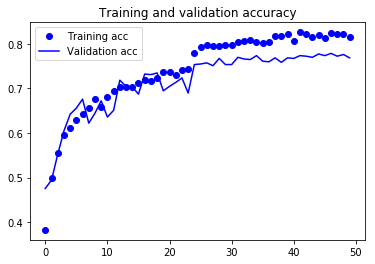

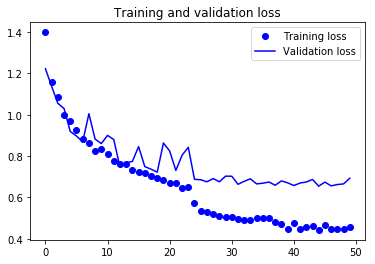

In [73]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [74]:
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=799,
        class_mode='categorical')

Found 799 images belonging to 5 classes.


In [76]:
model.evaluate_generator(test_generator, steps=1)

[0.7621198892593384, 0.7559449076652527]

# Visualizing how a NN learns
https://medium.com/@william_jordan/data-2040-mini-assignment-visualizing-how-a-convolutional-neural-network-learns-4c3108be4a87

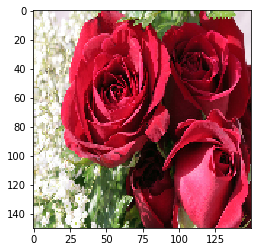

In [2]:
model = load_model('flower_model.h5')
img_path = '/home/ubuntu/NN_miniproject/rose.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [3]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


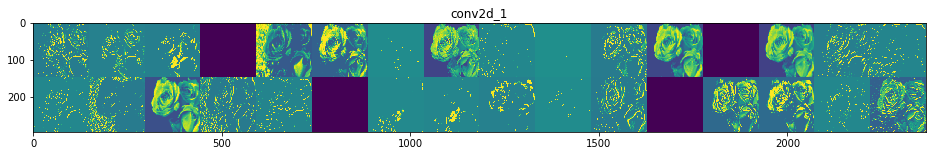

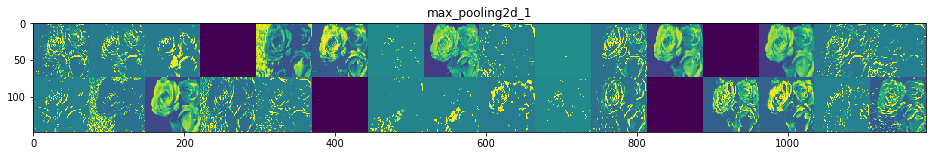

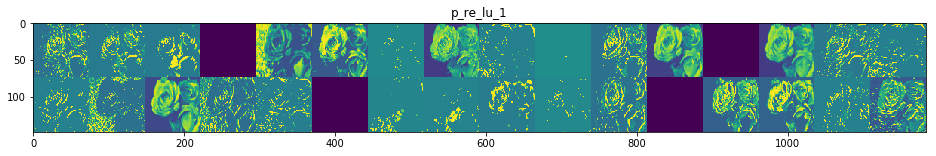

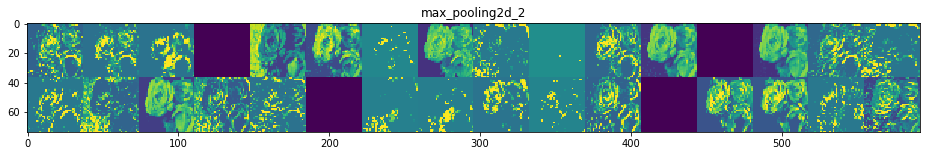

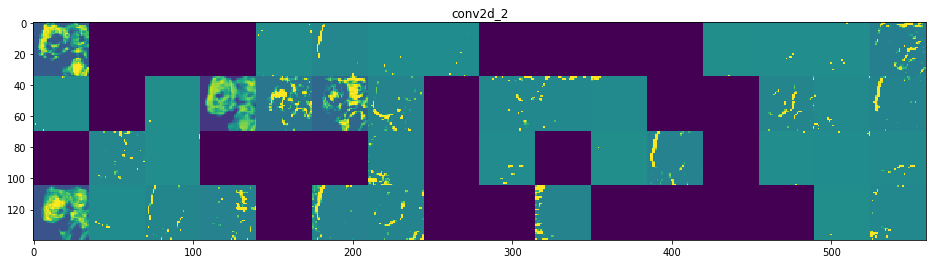

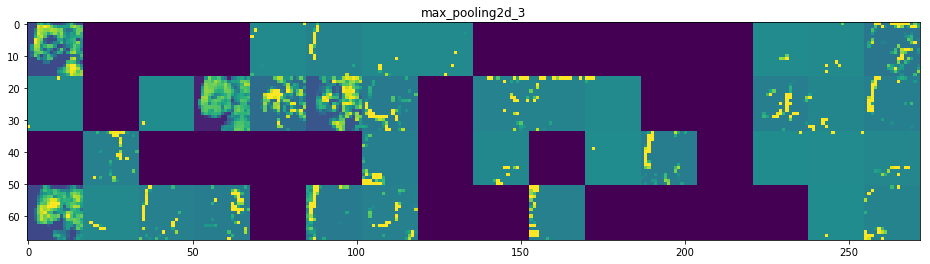

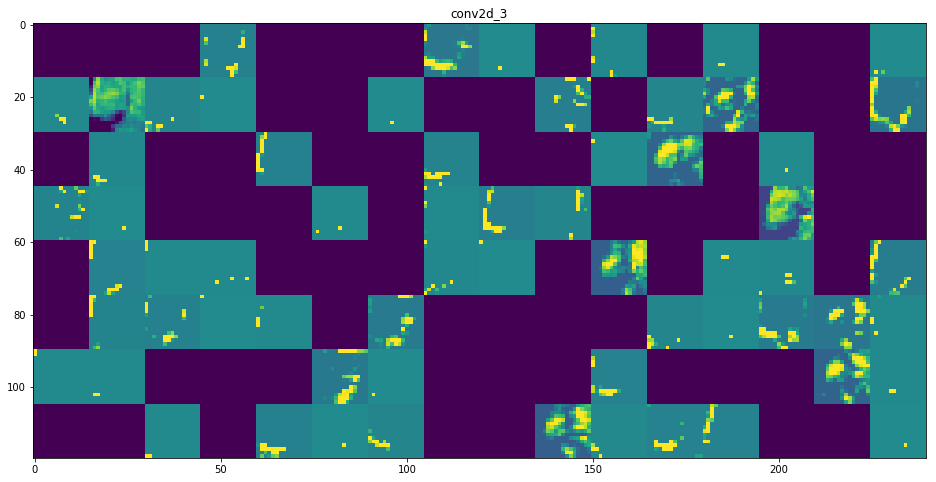

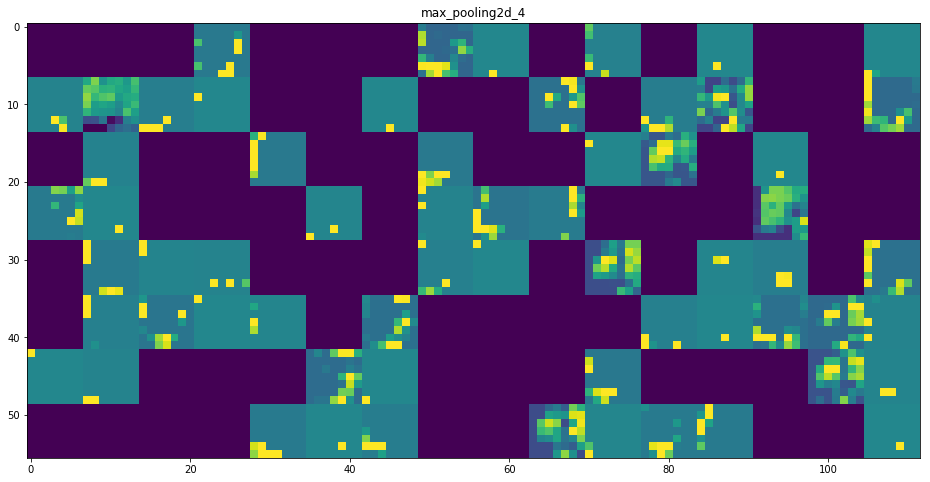

In [4]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in true_divide


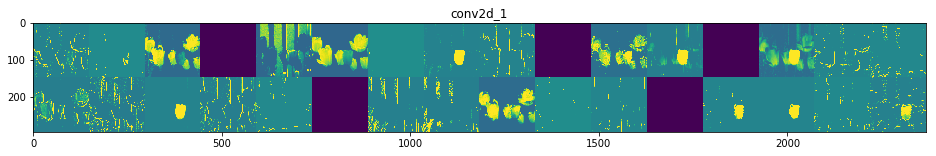

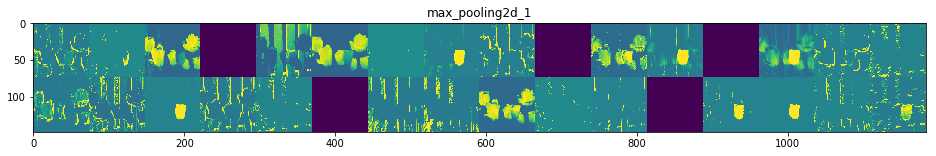

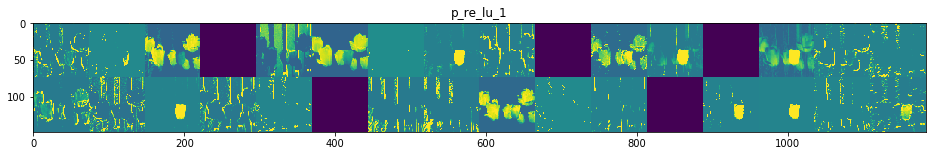

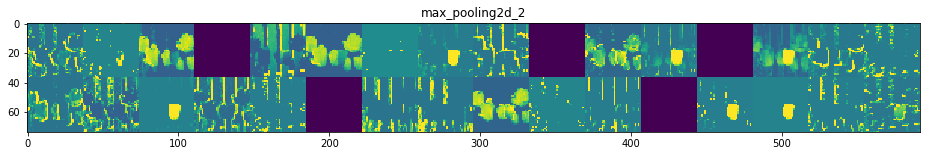

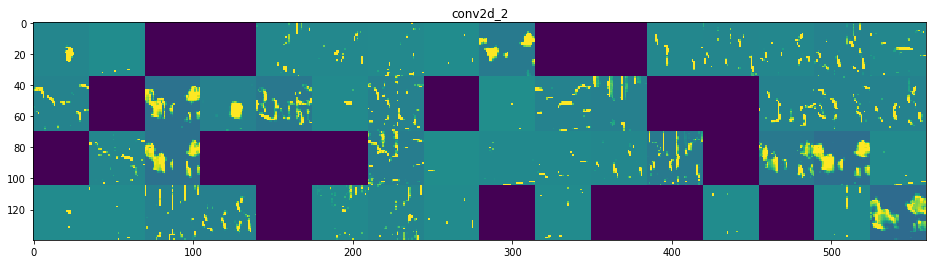

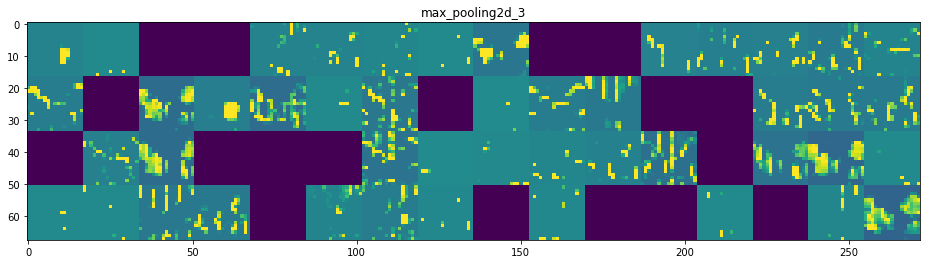

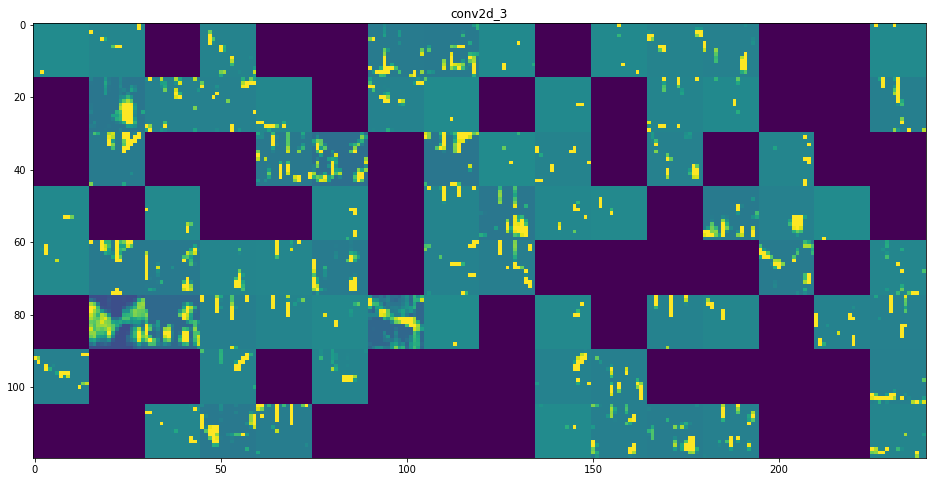

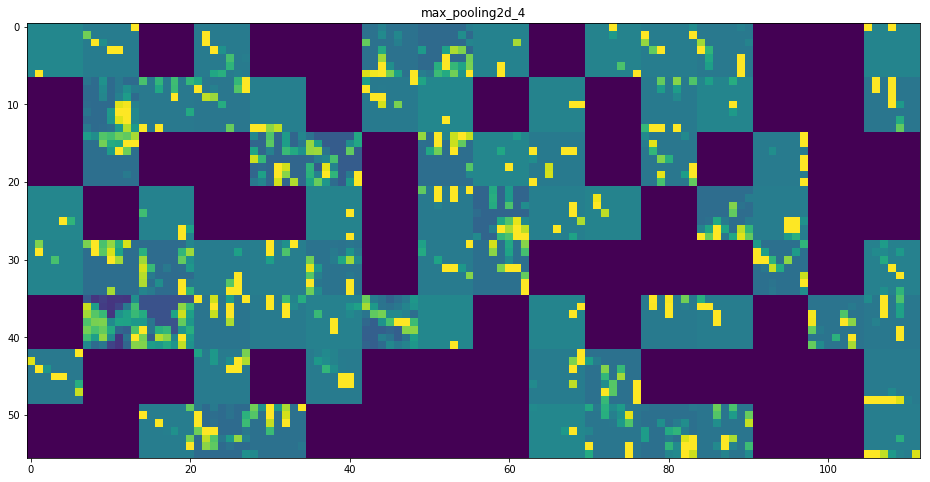

In [6]:
img_path = '/home/ubuntu/NN_miniproject/tulip.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in true_divide


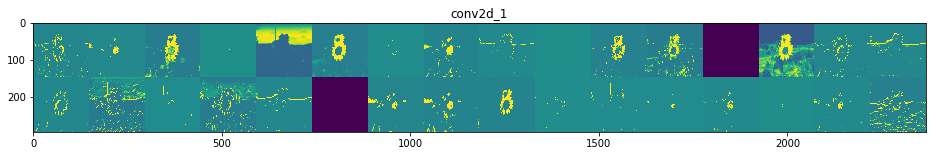

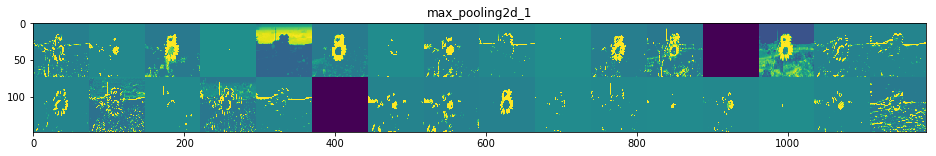

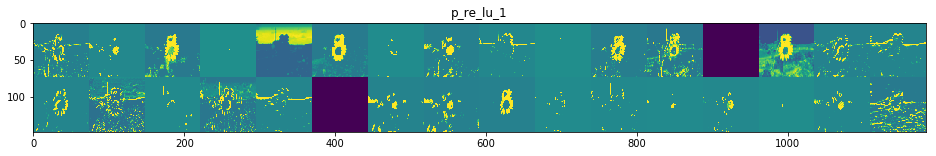

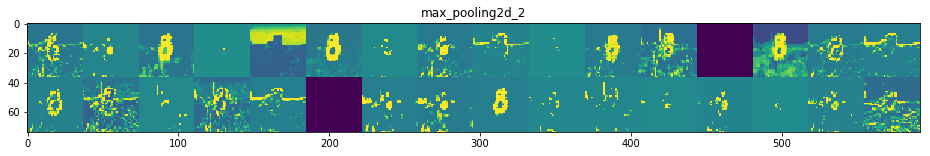

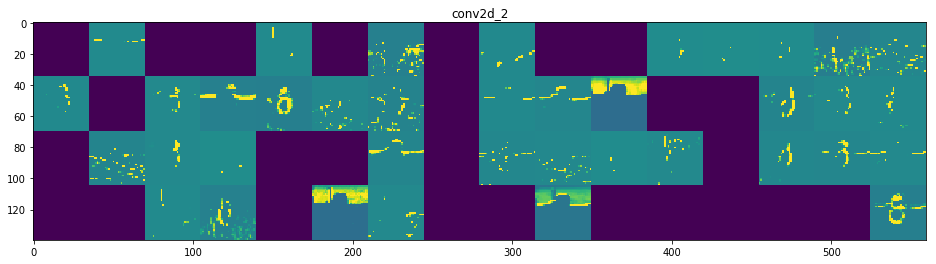

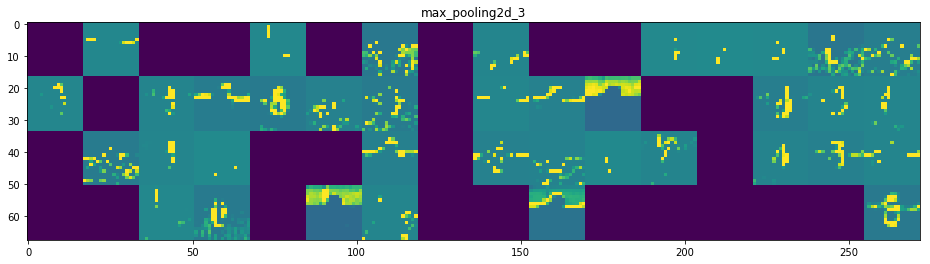

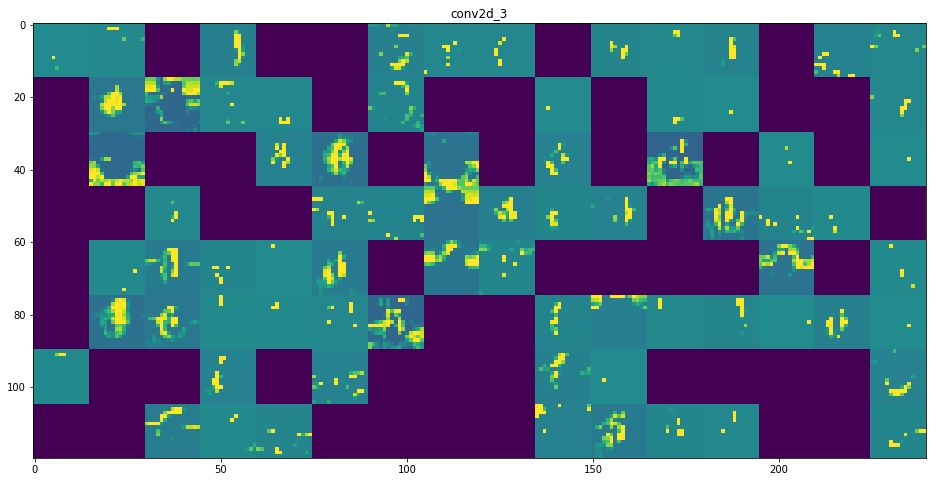

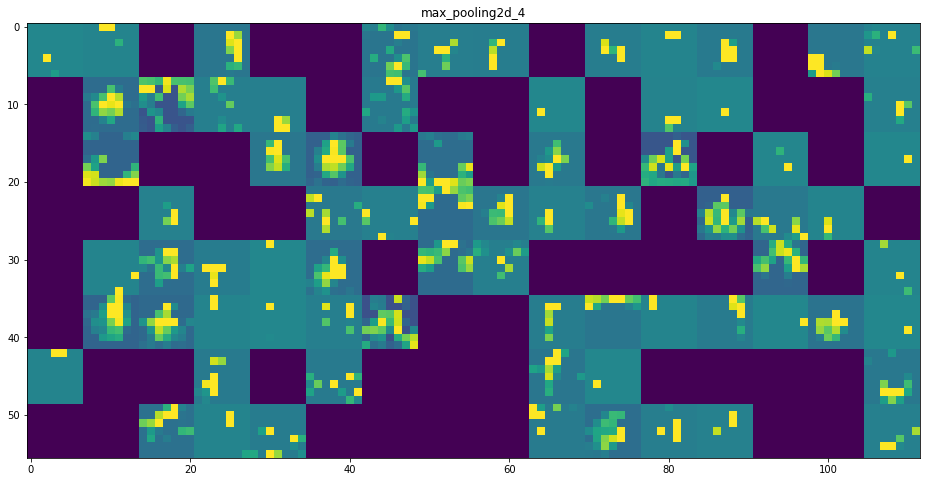

In [7]:
img_path = '/home/ubuntu/NN_miniproject/sunflower.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in true_divide


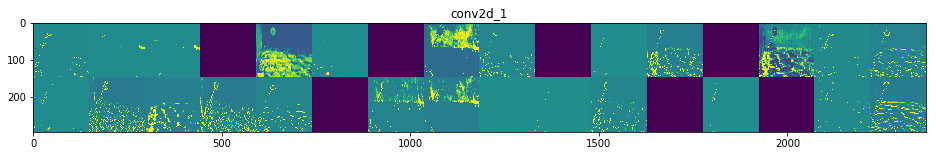

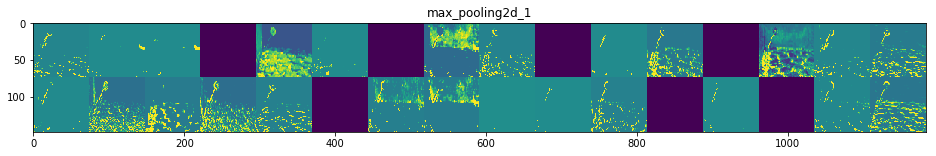

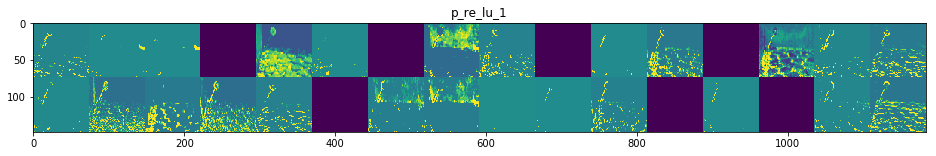

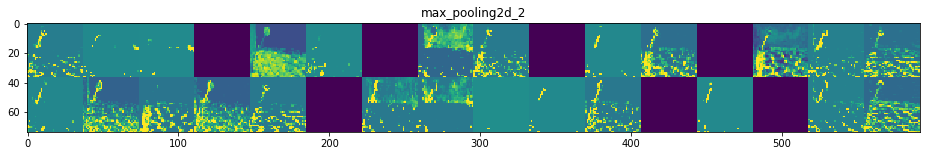

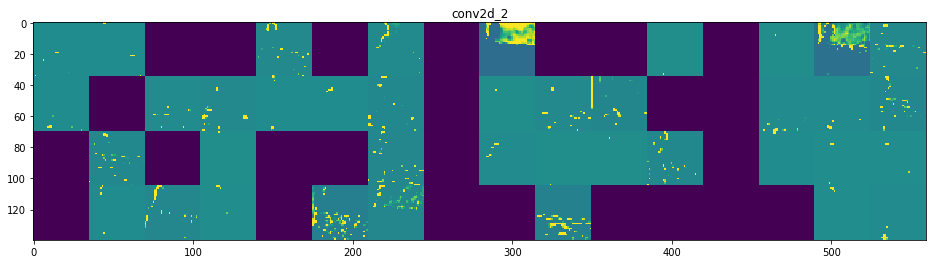

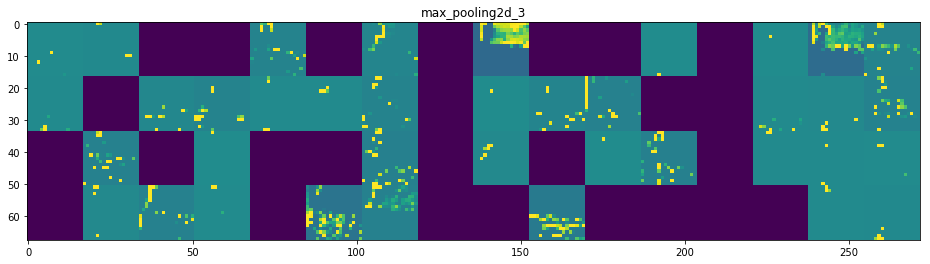

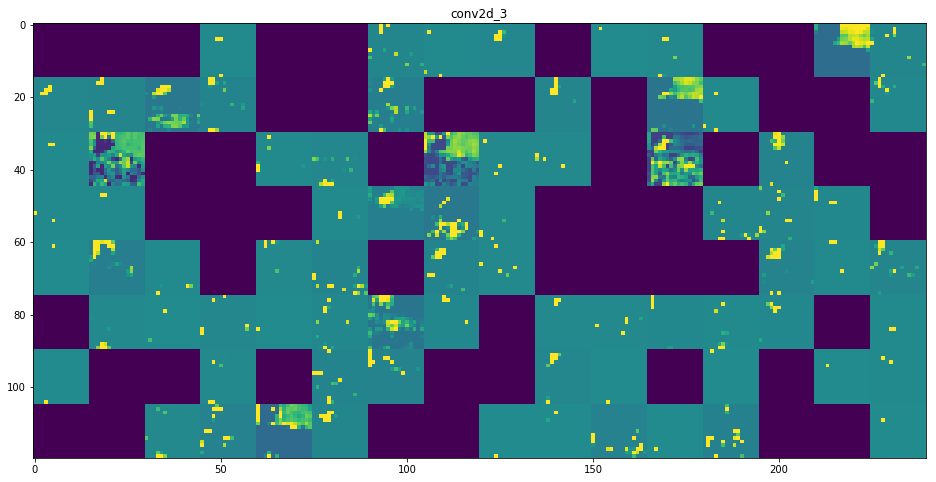

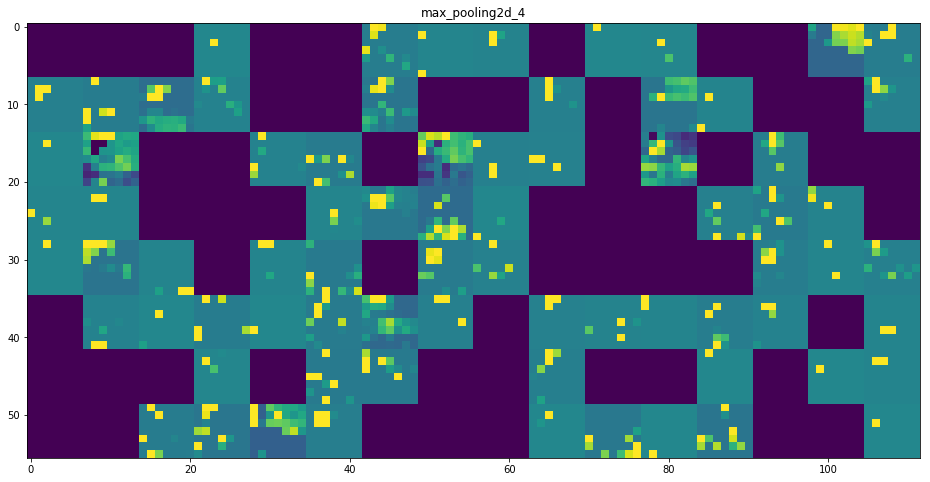

In [8]:
img_path = '/home/ubuntu/NN_miniproject/dandelion.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

In [38]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x


def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

In [39]:
model = load_model('flower_model.h5')
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 74, 74, 32)        175232    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       73856     
__________

In [40]:
model.layers.pop()
model.layers.pop()
model.layers.pop()
model.layers.pop()
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 74, 74, 32)        175232    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       73856     
__________

In [41]:
layer_name = 'conv2d_2'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

In [42]:
grads = K.gradients(loss, model.input)[0]

In [43]:
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [44]:
iterate = K.function([model.input], [loss, grads])

In [45]:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [46]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

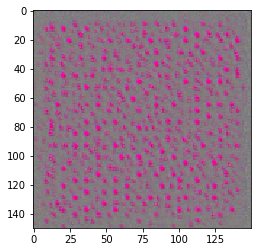

In [47]:
plt.imshow(generate_pattern('conv2d_2', 0))
plt.show()

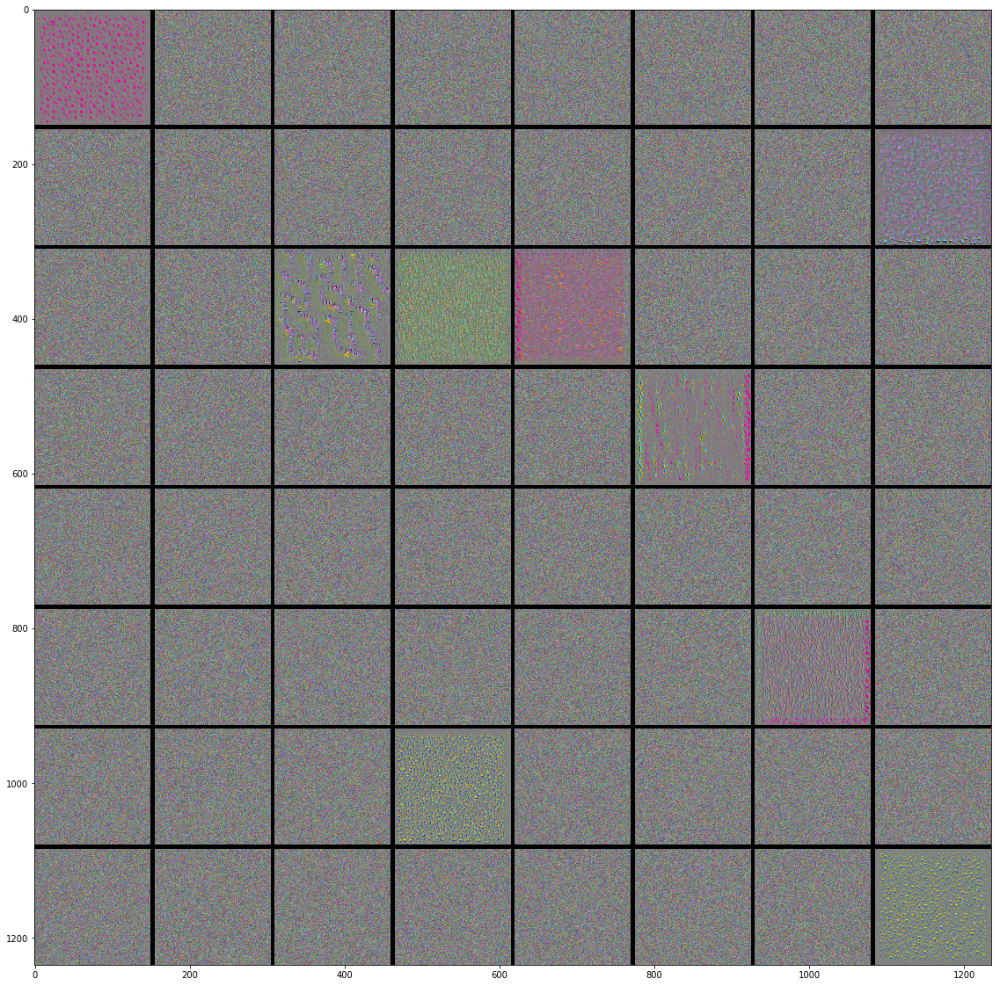

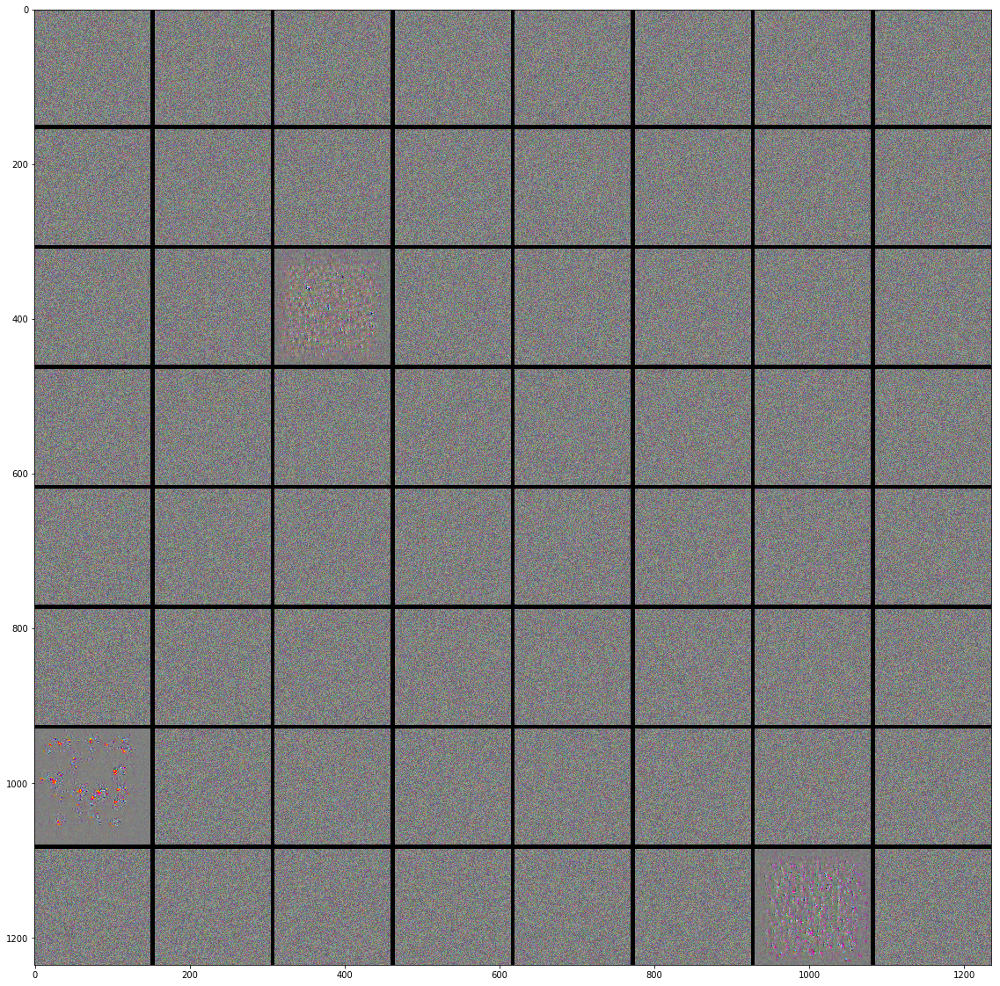

In [51]:
for layer_name in ['conv2d_2', 'conv2d_3']:
    size = 150
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results/255) #clipping issue so just divide for now
    plt.show()

In [52]:
model = load_model('flower_model.h5')

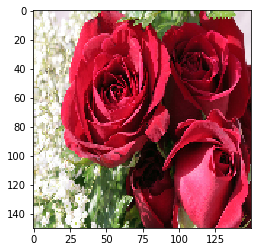

In [53]:
img_path = '/home/ubuntu/NN_miniproject/rose.jpg'
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
plt.imshow(img_tensor[0])
plt.show()

In [54]:
img_tensor.shape

(1, 150, 150, 3)

In [55]:
preds = model.predict(img_tensor)
classes = ['daisy','dandelion', 'rose', 'sunflower', 'tulip']
pred = np.argmax(preds[0])
print('Predicted:', classes[pred], preds[0][pred])

Predicted: rose 0.99929297


In [60]:
sunflower_output = model.output[:,2]
last_conv_layer = model.get_layer('conv2d_3')

grads = K.gradients(sunflower_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

#modified since i am using dropout with my model setup for output in train mode (could do test as well)
iterate = K.function([model.input, K.learning_phase()], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor, 1])

for i in range(32):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
heatmap = np.mean(conv_layer_output_value, axis=-1)

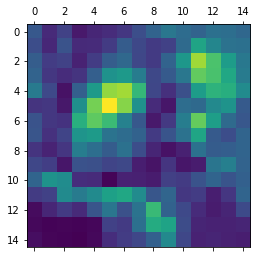

In [61]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

plt.matshow(heatmap)
plt.show()

In [62]:
# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img


# Save the image to disk
cv2.imwrite('/home/ubuntu/NN_miniproject/rose_NN.jpg', superimposed_img)

True

Predicted: daisy 0.99999976


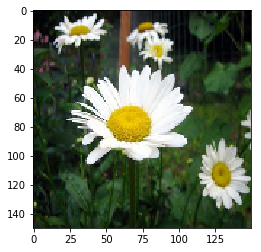

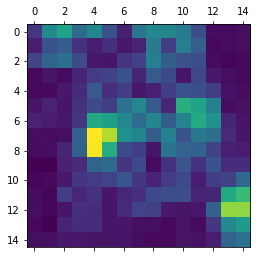

True

In [66]:
img_path = '/home/ubuntu/NN_miniproject/daisy.jpg'
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
plt.imshow(img_tensor[0])

preds = model.predict(img_tensor)
classes = ['daisy','dandelion', 'rose', 'sunflower', 'tulip']
pred = np.argmax(preds[0])
print('Predicted:', classes[pred], preds[0][pred])

sunflower_output = model.output[:,pred]
last_conv_layer = model.get_layer('conv2d_3')

grads = K.gradients(sunflower_output, last_conv_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))

#modified since i am using dropout with my model setup for output in train mode (could do test as well)
iterate = K.function([model.input, K.learning_phase()], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_tensor, 1])

for i in range(32):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
heatmap = np.mean(conv_layer_output_value, axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

plt.matshow(heatmap)
plt.show()

img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img


# Save the image to disk
cv2.imwrite('/home/ubuntu/NN_miniproject/daisy_NN.jpg', superimposed_img)

In [64]:
images = glob.glob('flowers/*/*jpg')

In [104]:
images_array = []
for i, img in enumerate(images):
    images_array.append(image.load_img(img, target_size=(150, 150)))

In [105]:
image_activations = []
for img in images_array:
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img /= 255.
    image_activations.append(np.squeeze(model.predict(img)))

In [106]:
fit = TSNE(n_components=2, perplexity=30, init='pca', n_iter=5000).fit_transform(image_activations)

In [107]:
graph = pd.DataFrame(fit, columns=['x', 'y'])
graph['image'] = images_array

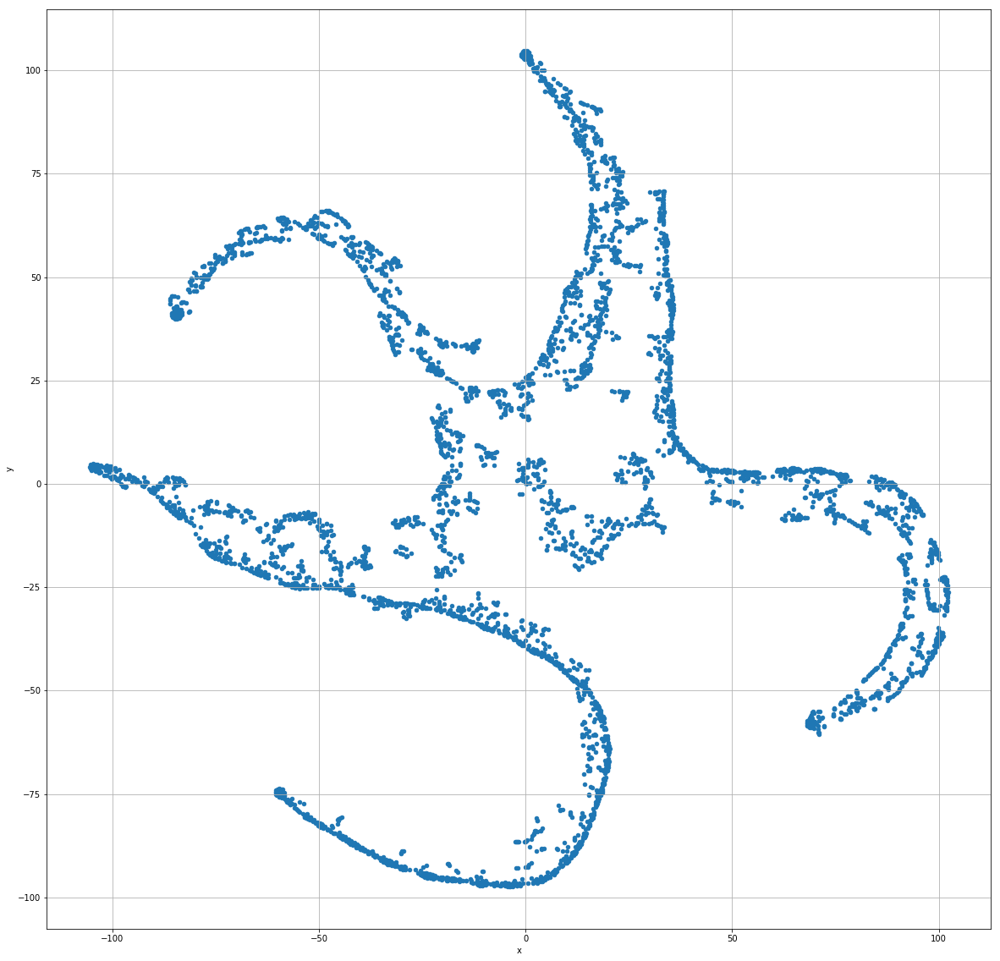

In [108]:
graph.plot('x', 'y', kind='scatter', figsize=(20,20), grid=True)
plt.show()

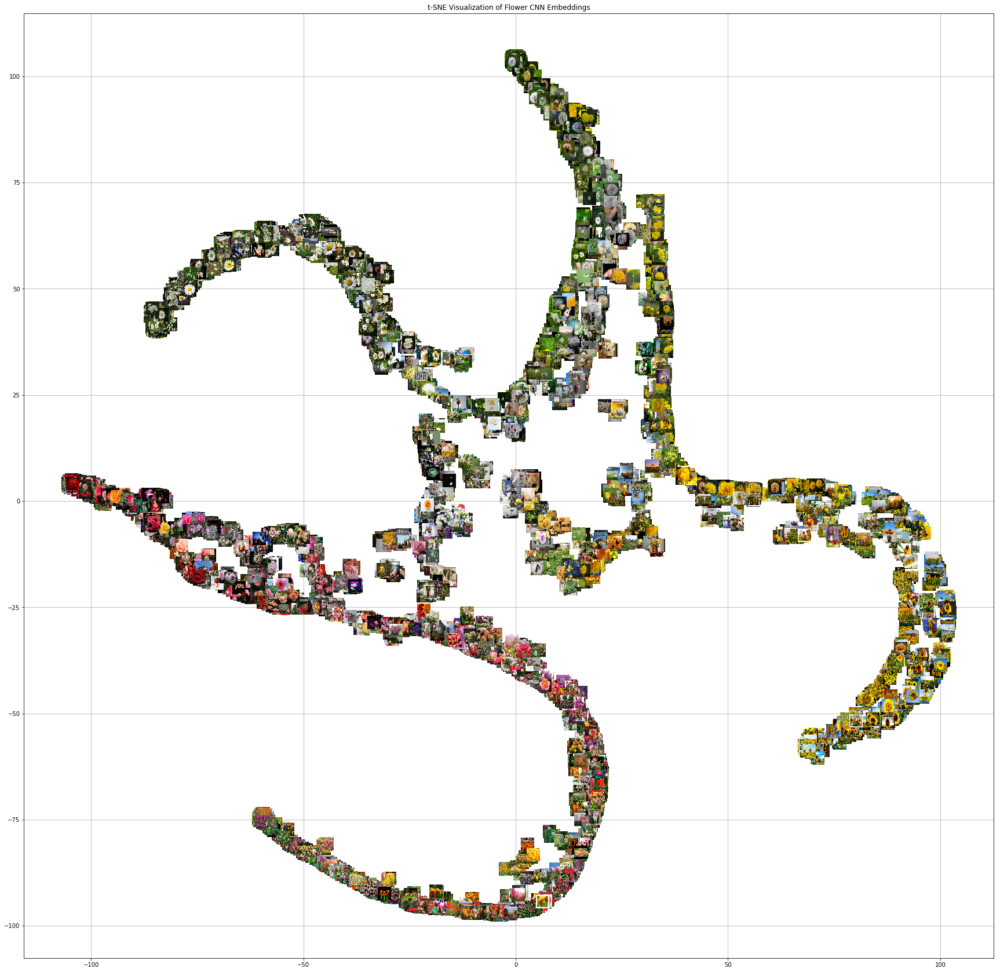

In [109]:
final_graph = plt.figure(figsize=(30,30))
ax = final_graph.add_subplot(111)
plt.scatter(graph['x'].values, graph['y'].values, marker='o', alpha=0)
for i in range(len(graph)):
    #plt.imshow(graph['image'].values[i], extent(graph['x'].values[i], graph['y'].values[i]))
    image = OffsetImage(graph['image'].values[i], zoom=0.15)
    ab = AnnotationBbox(image, (graph['x'].values[i], graph['y'].values[i]), frameon=False)
    ax.add_artist(ab)
    plt.title('t-SNE Visualization of Flower CNN Embeddings')
plt.grid()
plt.savefig('flower_embed.png')
plt.show()